# 1. Simulation Project Idea:
## This simulation project aims to simulate a model which is a function that calculates the spread of a virus within a population.
***
## 1.1 Choosing the right model to simulate:
### The initial model suggested has the following equation: 
## *Nd+1 = Nd + E\*P\*Nd* 
### Where: <br> 1. Nd+1 is the total number of cases on a given day <br> 2. Nd is the total number of cases in the previous day <br> 3. E is the average number of people someone infected is exposed to each day <br> 4. P is the probability of each exposure becoming an infection <br> NOTE: The factor *E\*P\*Nd* is the `new` number of cases on a given <br> By factoring the above equation we obtain: 
## *Nd+1 = (1+ E\*P)Nd* 
### However, after inspecting the model, it will generate an exponential graph where the number of people being infected will keep on increasing until infinity which is not realistic. It should stop increaseing at a certain point of time due to several factors such as the entire population getting infected (worst case scenario) thus it will stop increasing or due to other factors such as E decreasing because of quarantine for example, or P decreasing because of better hygiene...etc. 
### Thus, to account for this, we needed to introduce a new factor into the model equation to make it more realistic. This factor accounts for the case where an exposure from an infectious individualto another individual may not result in an infection because that human may be already infected. Therefore, we could inclue the factor:
## *(1- Nd/Population)*
### Here, the *Nd* which are the infected cases on a given day will not be infected by other infected individuals since they are infected already. So the new model equation becomes: 
## *Nd+1 = (1+ E\*P)\*(1- Nd/Population)\*Nd* 
<br> 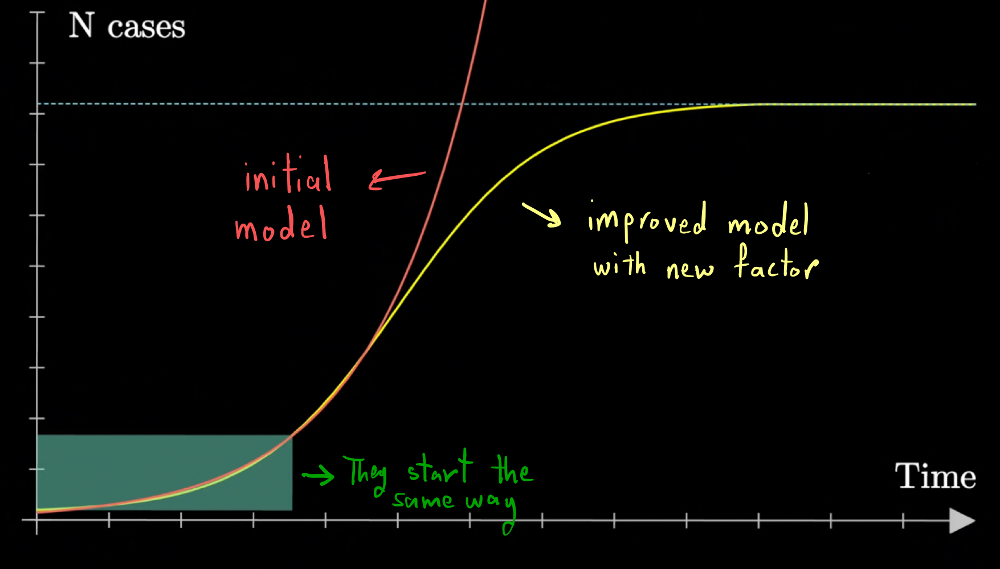
### Due to the new factor, this new modified equation will result in a Sigmoid shaped curve instead of an exponential curve. Initially, both graphs start the same way upwards but the one will reach an `inflection point` where it starts decreasing and eventually flattens. <br> NOTE: The slope of each point on the curve represnts the number of new cases at that specific point of time (day in our case).
***

## 1.2 Main inputs to the model:
### As seen from our equation, the two major inputs to our model are E and P. <br><br> 1. For input E, we will use mathematical tehcniques (explained in details in the following section) to `stochastically generate random variates` (samples) from a probability distribution of our choice.<br> In real life, this could be modified due to quarantine for example or less travelling/gathering. <br><br> 2. As for input P, we will determine it in a deterministic fashion. <br> P could be modified due to better hygiene, or people having better immunity to the virus.
***

# 2. Generating random variates to get samples from a spceific PDF of our choice:

## 1.1 Generating a uniformly distributed sequence of random numbers between 0 and 1 using LCG

In [20]:
# Generate a sequence of random number using LCG
def LCG(seed, num_values):
    '''
    `seed` is the intial seed value for generator
    `num_values` is the number of random values we want to generate
    `values` is a list that stores the generated random values
    '''
    # Same values as the chapter
    multiplier = 630360016 
    increment = 0
    modulus = 2**31 - 1
    values = []

    for _ in range(num_values):
        seed = (multiplier * seed + increment) % modulus
        values.append(seed/modulus)

    return values

In [21]:
# using the LCG function
random_sequence = LCG(3, 10)
random_sequence

[0.880602769963724,
 0.16397735856658657,
 0.3696712415524159,
 0.7397207402343493,
 0.6496562481157744,
 0.9567594951748659,
 0.6865804133408612,
 0.3388318607298806,
 0.1509972853357891,
 0.2002245835960957]

### Are these numbers uniformly distributed? <br> Let's check using a histogram with a much larger sample of generated sequence...

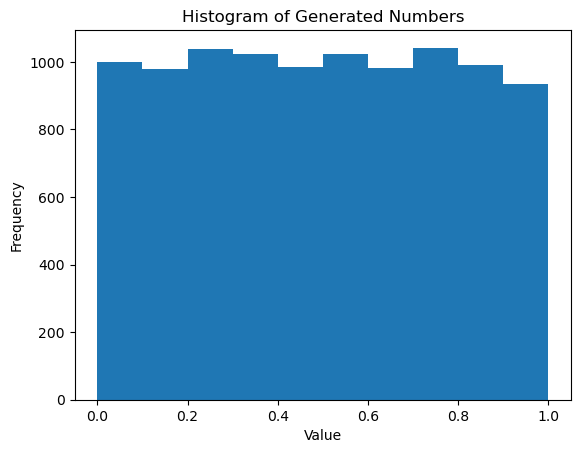

In [22]:
import matplotlib.pyplot as plt

# generate a large sequence of numbers then plot a histogram
large_sequence = LCG(3, 10000)

plt.hist(large_sequence, bins=10)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of Generated Numbers')
plt.show()

### As we can see the generated numbers are uniformly distributed.

### Let's improve the generated random sequence by inserting the current time as a random seed.

In [23]:
import time

# Get the current time in seconds
current_time = int(time.time())
current_time

1686464263

### This means that 1686195896 seconds have passed since January 1, 1970

In [24]:
# using the LCG function with current time as seed
random_sequence = LCG(current_time, 10)
random_sequence

[0.8142100916310261,
 0.38789504691394744,
 0.9789966754517503,
 0.001712094993196472,
 0.22730484801684733,
 0.6327774448472901,
 0.2583769337545973,
 0.09557889033834398,
 0.8429407583749577,
 0.9362904829607767]

***

## 1.2 Generate `random variates` using Inverse Transform Sampling.

### Now that we have a uniformly distributed set of random numbers between 0 and 1, we want to use them to generate random samples (or `variates`) of a desired PDF. How? <br> Using `Inverse Transform Sampling`. ([Youtube link](https://www.youtube.com/watch?v=9ixzzPQWuAY))  <br> How does it work? In order for Inverse Transform to be used to map uniformly distributed numbers into a PDF of our choice (Triangular, Exponential...etc) we follow these steps:
### 1. Have a set of uniformly distributed numbers (u) in range [0,1]. (Generated by LCG)
### 2. Identify the CDF of the desired PDF. (Note: CDF is the integral of the PDF)
### 3. Find the `inverse of the CDF`. This step is necessary to map uniformly distributed numbers between 0 and 1 to the desired distribution. The inverse CDF takes a value between 0 and 1 and maps it to a value from the desired distribution (PDF).  
### 3. Plug in a random number u (between 0 and 1, generated by LCG) into the inverse of the CDF obtained in the previous step to obtain a **`Random Variate`** sampled from the desired PDF.
### 4. Repeat steps 3 as many times as needed to generate the desired number of random variates from the desired PDF.
### 5. Use the random variates as an input for a variable in the main model.
> NOTE: These random variates are generated in a `stocahstic` (Random) fashion. The randomness comes from the fact that the method relies on generating uniformly distributed random numbers between 0 and 1. These random numbers introduce the element of chance into the process, as they determine which values from the desired distribution will be sampled. When you generate a uniform random number u between 0 and 1 and apply the inverse cumulative distribution function (CDF) to it, you obtain a random variate from the desired distribution. The key point is that the input random number u is generated randomly, and therefore, the resulting random variate will also be random. Each time you repeat step 3 of the inverse transform sampling method, you generate a different random number u and obtain a different random variate. The randomness arises from the inherent randomness of the initial uniform random number generator.

***

## 1.3 Which PDF to choose for input E?
### Since we have limited knowledge about how many people each person encounters per day, within each run of the simulation we will specify a different set of minium, maximum, and most likely number of people each person in the population might encounter or be exposed to then compare the results. Thus, the PDF of choice is the *`Triangular distribution`* function.<br> So we need to obtain the CDF of the Triangular distribution and apply inverse transfomation on it to generate random variates.

In [25]:
import numpy as np
import math

def generate_triangular_variates(random_numbers, a_b_c_tuple):
    """
    Generates random variates from the Triangular distribution using the provided list of random numbers.
    
    Args:
        random_numbers (list): List of random numbers (u) between 0 and 1.
        a_b_c_tuple: Tuple containing a, b, and c values which are:
            a (float): Lower limit of the Triangular distribution.
            b (float): Most likely value of the Triangular distribution.
            c (float): Upper limit of the Triangular distribution.
    
    Returns:
        list: List of random variates from the Triangular distribution.
    """
    a = a_b_c_tuple[0]
    b = a_b_c_tuple[1]
    c = a_b_c_tuple[2]
    variates = []
    for u in random_numbers:
        # Apply inverse CDF of Triangular distribution
        if u <= (b - a) / (c - a):
            variate = a + np.sqrt(u * (b - a) * (c - a))
        else:
            variate = c - np.sqrt((1 - u) * (c - b) * (c - a))
        variates.append(variate)

    # We must round the variates to the nearest integer since a person cannot be 1.5, or 4.6. Must be an integer
    rounded_variates = [math.ceil(num) if num % 1 >= 0.5 else math.floor(num) for num in variates] 

    return rounded_variates

In [26]:
# trying out the function
a = 1  # lower limit
b = 4  # mode (most likely value)
c = 7  # upper limit

exposures_tuple = (a, b, c)

triangular_variates = generate_triangular_variates(random_sequence, exposures_tuple) # random_squence is the list of random numbers generated above using LCG
print([round(variate, 3) for variate in triangular_variates])

[5, 4, 6, 1, 3, 4, 3, 2, 5, 6]


### Let's make sure we get a triangular probability distribution with a large set of values by making a histogram.

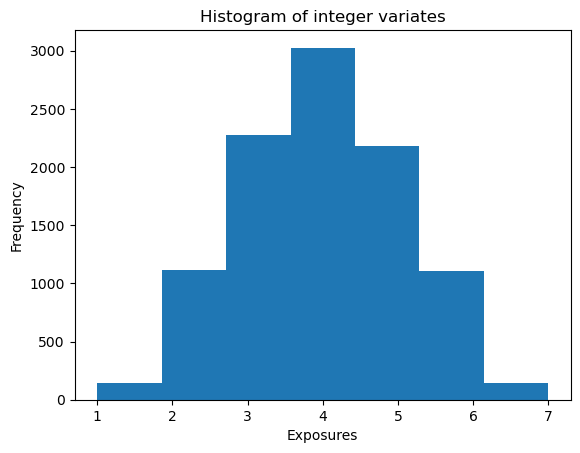

In [27]:
random_sequence = LCG(current_time, 10000) # generate 10000 uniform random values between 0 and 1 using LCG
triangular_variates = generate_triangular_variates(random_sequence, exposures_tuple) # Get samples from triangular distribution using random values by utilizing inverse transform

plt.hist(triangular_variates, bins=7)
plt.xlabel('Exposures')
plt.ylabel('Frequency')
plt.title('Histogram of integer variates')
plt.show()

### So our generated samples indeed adhere to the traingular probability distribution.

***

# 2. Simulating the model:

## 2.1 Plotting function:

In [28]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

def PlotSimulation(days, newCases, currentTotalCases,suceptibaleCases,deaths):
    x = []
    y_new = []
    y_total = []
    y_suceptibale = []
    y_deaths = []
    
    fig, ax = plt.subplots()
    ln_new, = ax.plot(x, y_new, 'b-', label='New Cases')
    ln_total, = ax.plot(x, y_total, 'y-', label='Total Cases')
    ln_suceptibale, = ax.plot(x, y_suceptibale, 'g-', label='Suceptibale Cases')
    ln_deaths, = ax.plot(x, y_deaths, 'r-', label='Deaths')

    ax.set_xlabel('Days')
    ax.set_ylabel('Cases')
    ax.set_title('Simulation of Pandemic')
    ax.legend()
    plt.xlim(0, max(days))
    plt.ylim(0, max(suceptibaleCases))
        
    def artists():
        return ln_new, ln_total, ln_suceptibale, ln_deaths
        
    def update(frame):
        y_new.append(newCases[frame])
        y_total.append(currentTotalCases[frame])
        y_suceptibale.append(suceptibaleCases[frame])
        y_deaths.append(deaths[frame])
        x.append(days[frame])
        ln_new.set_data(x, y_new)
        ln_total.set_data(x, y_total)
        ln_suceptibale.set_data(x, y_suceptibale)
        ln_deaths.set_data(x, y_deaths)
        fig.gca().relim()
        fig.gca().autoscale_view()

    ani = FuncAnimation(fig, update, frames=days[-1], interval=500, init_func=artists)
    # ani.save("COVID_simulation.gif", writer=PillowWriter(fps=60)) ##########
    html = HTML(ani.to_jshtml())
    plt.close(fig)  # Close the initial figure to prevent duplicate display
    display(html)

## 2.2 Main simulation function:

In [29]:
import math

def MainSimulation(avgExposureTuple, deathRate, healingRate, infectionProbability):
    simulationDays = 0
    totalPopulation = 20000000 
    activeCases = 1
    currentTotalNumberOfCases = 1 ##### (Nd) Total infected cases from beginning including healed and active 
    totalDeaths = 0
    newCases = -1
    healingRate = healingRate
    deathRate = deathRate
    suceptibaleCases = totalPopulation - activeCases # a Susceptible person is a person who might get infected
    infectionProbability = infectionProbability # (E) could be varied due to hygiene or wearing masks..etc.
    
    random_sequence = LCG(current_time, 1) # generate a list of uniformly distributed random numbers (1 number in this case)
    averageNumberofExposures = generate_triangular_variates(random_sequence, avgExposureTuple) # (E) Generate a random variate from triangular distribution (list with 1 element in this case)
    E = averageNumberofExposures[0] # change the list with 1 int element into a single int variable

    # dictionary to store daily statistics
    statisticalAccumlator = { ##### I think we should also add the days
        "newCassesAcc": [],
        "currentTotalCasesAcc": [],
        "suceptibaleCasesAcc": [],
        "totalDeathsAcc": [],
    }

    while (currentTotalNumberOfCases < totalPopulation and math.floor(activeCases) > 0
           and simulationDays < 200):
        simulationDays += 1

        # Generate new random variate every day according to the same exposure tuple 
        averageNumberofExposures = generate_triangular_variates(random_sequence, avgExposureTuple) # E as a list with one element
        E = averageNumberofExposures[0]
        
        sigmoidFactor = (1 - (currentTotalNumberOfCases / totalPopulation)) # (1- Nd/Population)

        newCases = E * infectionProbability * activeCases * sigmoidFactor # delta Nd, number of new cases on a given day

        currentTotalNumberOfCases += newCases

        if currentTotalNumberOfCases > totalPopulation:
            currentTotalNumberOfCases = totalPopulation

        suceptibaleCases -= newCases

        healed = activeCases * healingRate # Every day, a portion of the active cases will be healed

        deaths = (activeCases - healed) * deathRate # portion of the remaining active cases that were not healed will die
        # NOTE: probability of healed + death = probability of Removed

        activeCases = newCases + (activeCases  - deaths - healed) # (activeCases  - deaths - healed) = the infected cases that were not healed or have not died

        totalDeaths += deaths

        statisticalAccumlator["currentTotalCasesAcc"].append(
            currentTotalNumberOfCases)

        statisticalAccumlator["newCassesAcc"].append(newCases)

        statisticalAccumlator["suceptibaleCasesAcc"].append(suceptibaleCases)

        statisticalAccumlator["totalDeathsAcc"].append(totalDeaths)

    PlotSimulation(range(1, simulationDays+1),
                   statisticalAccumlator["newCassesAcc"], statisticalAccumlator["currentTotalCasesAcc"], statisticalAccumlator["suceptibaleCasesAcc"], statisticalAccumlator["totalDeathsAcc"])

In [30]:
# Simulating using some specific parameters
MainSimulation(avgExposureTuple=(1,2,4), deathRate=0.1, healingRate=0.4, infectionProbability=0.3)

### With the selected parameters, almost half the population gets infected throughout the simulation.

In [31]:
# Now simulate if no deaths happen and no one can be healed (NO removed/recovered cases)
MainSimulation(avgExposureTuple=(1,2,4), deathRate=0, healingRate=0, infectionProbability=0.6)

### As expected, we can see that the entire population becomes infected very fast and simulation ends as the probability of infection is increased and the simulation only lasts for 20 days for every person to be infected. This is the simulation of the initial model suggested (exponential growth).

***

# Extras:
### 1. Plotting with the active cases:

In [32]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML

def PlotSimulation2(days, newCases, currentTotalCases,suceptibaleCases,deaths,activeCases):
    x = []
    y_active = []
    y_new = []
    y_total = []
    y_suceptibale = []
    y_deaths = []
    
    fig, ax = plt.subplots()
    ln_active, = ax.plot(x, y_active, 'm-', label='Active Cases')
    ln_new, = ax.plot(x, y_new, 'b-', label='New Cases')
    ln_total, = ax.plot(x, y_total, 'y-', label='Total Cases')
    ln_suceptibale, = ax.plot(x, y_suceptibale, 'g-', label='Suceptibale Cases')
    ln_deaths, = ax.plot(x, y_deaths, 'r-', label='Deaths')

    ax.set_xlabel('Days')
    ax.set_ylabel('Cases')
    ax.set_title('Simulation of Pandemic')
    ax.legend()
    plt.xlim(0, max(days))
    plt.ylim(0, max(suceptibaleCases))
        
    def artists():
        return ln_active, ln_new, ln_total, ln_suceptibale, ln_deaths
        
    def update(frame):
        y_active.append(activeCases[frame])
        y_new.append(newCases[frame])
        y_total.append(currentTotalCases[frame])
        y_suceptibale.append(suceptibaleCases[frame])
        y_deaths.append(deaths[frame])
        x.append(days[frame])
        ln_active.set_data(x, y_active)
        ln_new.set_data(x, y_new)
        ln_total.set_data(x, y_total)
        ln_suceptibale.set_data(x, y_suceptibale)
        ln_deaths.set_data(x, y_deaths)
        fig.gca().relim()
        fig.gca().autoscale_view()

    ani = FuncAnimation(fig, update, frames=days[-1], interval=500, init_func=artists)
    # ani.save("COVID_simulation.gif", writer=PillowWriter(fps=60)) ##########
    html = HTML(ani.to_jshtml())
    plt.close(fig)  # Close the initial figure to prevent duplicate display
    display(html)

In [33]:
import math

def MainSimulation2(avgExposureTuple, deathRate, healingRate, infectionProbability):
    simulationDays = 0
    totalPopulation = 20000000 
    activeCases = 1
    currentTotalNumberOfCases = 1 ##### (Nd) Total infected cases from beginning including healed and active 
    totalDeaths = 0
    newCases = -1
    healingRate = healingRate
    deathRate = deathRate
    suceptibaleCases = totalPopulation - activeCases # a Susceptible person is a person who might get infected
    infectionProbability = infectionProbability # (E) could be varied due to hygiene or wearing masks..etc.
    
    random_sequence = LCG(current_time, 1) # generate a list of uniformly distributed random numbers (1 number in this case)
    averageNumberofExposures = generate_triangular_variates(random_sequence, avgExposureTuple) # (E) Generate a random variate from triangular distribution (list with 1 element in this case)
    E = averageNumberofExposures[0] # change the list with 1 int element into a single int variable

    # dictionary to store daily statistics
    statisticalAccumlator = { 
        "newCassesAcc": [],
        "currentTotalCasesAcc": [],
        "suceptibaleCasesAcc": [],
        "totalDeathsAcc": [],
        "simulationDay": [],
        "activeCases": []
    }

    while (currentTotalNumberOfCases < totalPopulation and math.floor(activeCases) > 0
           and simulationDays < 200):
        simulationDays += 1

        # Generate new random variate every day according to the same exposure tuple 
        averageNumberofExposures = generate_triangular_variates(random_sequence, avgExposureTuple) # E as a list with one element
        E = averageNumberofExposures[0]
        
        sigmoidFactor = (1 - (currentTotalNumberOfCases / totalPopulation)) # (1- Nd/Population)

        newCases = E * infectionProbability * activeCases * sigmoidFactor # delta Nd, number of new cases on a given day

        currentTotalNumberOfCases += newCases

        if currentTotalNumberOfCases > totalPopulation:
            currentTotalNumberOfCases = totalPopulation

        suceptibaleCases -= newCases

        healed = activeCases * healingRate # Every day, a portion of the active cases will be healed

        deaths = (activeCases - healed) * deathRate # portion of the remaining active cases that were not healed will die
        # NOTE: probability of healed + death = probability of Removed

        activeCases = newCases + (activeCases  - deaths - healed) # (activeCases  - deaths - healed) = the infected cases that were not healed or have not died

        totalDeaths += deaths

        statisticalAccumlator["simulationDay"].append(simulationDays)

        statisticalAccumlator["activeCases"].append(activeCases)

        statisticalAccumlator["currentTotalCasesAcc"].append(currentTotalNumberOfCases)

        statisticalAccumlator["newCassesAcc"].append(newCases)

        statisticalAccumlator["suceptibaleCasesAcc"].append(suceptibaleCases)

        statisticalAccumlator["totalDeathsAcc"].append(totalDeaths)

    PlotSimulation2(range(1, simulationDays+1),
                   statisticalAccumlator["newCassesAcc"], statisticalAccumlator["currentTotalCasesAcc"], statisticalAccumlator["suceptibaleCasesAcc"], statisticalAccumlator["totalDeathsAcc"], statisticalAccumlator["activeCases"])
    
    return statisticalAccumlator

In [49]:
statistics = MainSimulation2(avgExposureTuple=(1,2,4), deathRate=0.1, healingRate=0.7, infectionProbability=0.3)

In [34]:
statistics = MainSimulation2(avgExposureTuple=(1,2,4), deathRate=0.1, healingRate=0.4, infectionProbability=0.3)

In [35]:
# Check the statistics
statistics

{'newCassesAcc': [0.8999999549999999,
  1.2959998363800063,
  1.8662395326469,
  2.687384407843769,
  3.8698324151202246,
  5.572556249991026,
  8.024475850389717,
  11.55523438026041,
  16.63951478167321,
  23.96085381684412,
  34.50353056934468,
  49.68487817172706,
  71.54579669494278,
  103.02505853206655,
  148.35423935257862,
  213.62627601812332,
  307.61389418246966,
  442.9475307384056,
  637.8102706473372,
  918.3759201549448,
  1322.3143688834489,
  1903.8279893978674,
  2740.8805964003313,
  3945.5585714570757,
  5678.890340179427,
  8171.978488935349,
  11756.000500335673,
  16904.524092184136,
  24292.619289897393,
  34878.24501772483,
  50011.82945781301,
  71578.6497235028,
  102172.99516538458,
  145288.16189726285,
  205473.11481447052,
  288341.2729906142,
  400203.5600156875,
  546935.8540348161,
  731544.7683190741,
  949997.5348360973,
  1185734.8956808671,
  1405461.2523083966,
  1561770.0892107226,
  1608215.4191113603,
  1523823.7484504813,
  1329548.249755725,

### This is not very helpful to look at. <br> Let's turn it into a Pandas datafram for further analysis...

In [36]:
import pandas as pd

# Convert dictionary to DataFrame
df = pd.DataFrame(statistics)
df

,newCassesAcc,currentTotalCasesAcc,suceptibaleCasesAcc,totalDeathsAcc,simulationDay,activeCases
0,0.900000,1.900000e+00,2.000000e+07,6.000000e-02,1,1.440000
1,1.296000,3.196000e+00,2.000000e+07,1.464000e-01,2,2.073600
2,1.866240,5.062239e+00,1.999999e+07,2.708160e-01,3,2.985983
3,2.687384,7.749624e+00,1.999999e+07,4.499750e-01,4,4.299815
4,3.869832,1.161946e+01,1.999999e+07,7.079639e-01,5,6.191733
...,...,...,...,...,...,...
87,0.909649,1.624505e+07,3.754953e+06,2.118919e+06,88,3.816684
88,0.644916,1.624505e+07,3.754952e+06,2.118919e+06,89,2.705926
89,0.457228,1.624505e+07,3.754952e+06,2.118919e+06,90,1.918428
90,0.324162,1.624505e+07,3.754951e+06,2.118919e+06,91,1.360113


### Let's re-organize the dataframe. <br> First, let's make `simulation days` column the index of the dataframe.

In [37]:
df.set_index('simulationDay', inplace=True)
df

,newCassesAcc,currentTotalCasesAcc,suceptibaleCasesAcc,totalDeathsAcc,activeCases
simulationDay,,,,,
1,0.900000,1.900000e+00,2.000000e+07,6.000000e-02,1.440000
2,1.296000,3.196000e+00,2.000000e+07,1.464000e-01,2.073600
3,1.866240,5.062239e+00,1.999999e+07,2.708160e-01,2.985983
4,2.687384,7.749624e+00,1.999999e+07,4.499750e-01,4.299815
5,3.869832,1.161946e+01,1.999999e+07,7.079639e-01,6.191733
...,...,...,...,...,...
88,0.909649,1.624505e+07,3.754953e+06,2.118919e+06,3.816684
89,0.644916,1.624505e+07,3.754952e+06,2.118919e+06,2.705926
90,0.457228,1.624505e+07,3.754952e+06,2.118919e+06,1.918428


### We can access the statistics of any desired day using the `.iloc[day]`.<br> For example:

In [38]:
# statistics from day 3, due to re-setting the index, they are incremented by one, so to access day 3 use .iloc[2]
df.iloc[2]

newCassesAcc            1.866240e+00
currentTotalCasesAcc    5.062239e+00
suceptibaleCasesAcc     1.999999e+07
totalDeathsAcc          2.708160e-01
activeCases             2.985983e+00
Name: 3, dtype: float64

Note: 1.999999e+07 means 1.999999 * 10^7 so 19,999,999 <br>
So there are 2.985983 cases on day 3 of the simulation.

In [39]:
# Another example of day 56
df.iloc[55]

newCassesAcc            5.524004e+04
currentTotalCasesAcc    1.611109e+07
suceptibaleCasesAcc     3.888907e+06
totalDeathsAcc          2.072320e+06
activeCases             2.233069e+05
Name: 56, dtype: float64

### Some numbers don't make much sense. For example, there can't be 2.233069e+05 (223,306.9) active cases on day 56 or 2.985983 on day 3. All numbers must be rounded for them to make sense. <br> Let's do that on all the columns:

In [40]:
df = df.round().astype(int)
df

,newCassesAcc,currentTotalCasesAcc,suceptibaleCasesAcc,totalDeathsAcc,activeCases
simulationDay,,,,,
1,1,2,19999998,0,1
2,1,3,19999997,0,2
3,2,5,19999995,0,3
4,3,8,19999992,0,4
5,4,12,19999988,1,6
...,...,...,...,...,...
88,1,16245047,3754953,2118919,4
89,1,16245048,3754952,2118919,3
90,0,16245048,3754952,2118919,2


### This is much better.

In [41]:
df.iloc[55]

newCassesAcc               55240
currentTotalCasesAcc    16111093
suceptibaleCasesAcc      3888907
totalDeathsAcc           2072320
activeCases               223307
Name: 56, dtype: int64

### What percentage of the population died due to the pandemic?

In [42]:
total_deaths = df['totalDeathsAcc'].iloc[-1] / 20000000 # df['totalDeathsAcc'].iloc[-1] is the last element in the totalDeathsAcc column
total_deaths *= 100
print(f"%{total_deaths:.3f} of the entire population have sadly passed away")

%10.595 of the entire population have sadly passed away


### What percentage of the population remained un-infected?

In [43]:
remained_susceptable = df['suceptibaleCasesAcc'].iloc[-1] / 20000000
remained_susceptable *= 100
print(f"%{remained_susceptable:.3f} of the entire population have not been infected at all")

%18.775 of the entire population have not been infected at all


### On which day was the highest number of active cases?

In [44]:
max_active_cases_day = df.loc[df['activeCases'].idxmax()]
max_active_cases_day

newCassesAcc             1523824
currentTotalCasesAcc    10891153
suceptibaleCasesAcc      9108847
totalDeathsAcc            997506
activeCases              3243607
Name: 45, dtype: int64

### The maximum number of active cases in a single day during the pandemic is 3243607 which happened to be on day 44. <br> So %16.2 of the population was infected at the same time during the pandemic on day 44.

### What day had the most new cases?

In [45]:
max_new_cases_day = df.loc[df['newCassesAcc'].idxmax()]
max_new_cases_day

newCassesAcc             1608215
currentTotalCasesAcc     9367329
suceptibaleCasesAcc     10632671
totalDeathsAcc            806419
activeCases              3184783
Name: 44, dtype: int64

### Interesting, day 43 had the most new cases (1608215) in any day during the simulation of the pandemic. It also makes sense for the day which had the most new cases (43) to be close to the days that had the most active cases (44).

### What about `Growth Factor`? <br> Growth factor is a measure used to quantify the rate of increase in a pandemic or epidemic. <br> It is the ratio of new cases one day to the new cases the previous day. This factor is very important to be tracked during pandemics because it tells if the situation is getting better or worse overall. If the growth factor keeps on decreasing towards 1, it means we're getting closer towards the `inflection point` where the growth factor becomes less than 1. Once it is less than 1, it suggests a decline in cases and the curve of the total number of cases starts to decrease slowly to the points where it flattened thus ending the pandemic. If it keeps on increasing then it signals exponential growth and that the virus is spreading extremely fast.<br> <br> Monitoring the growth factor can help in assessing the severity of a pandemic, estimating the future trajectory of the disease, and making informed decisions regarding public health interventions and measures to control the spread of the virus. <br>
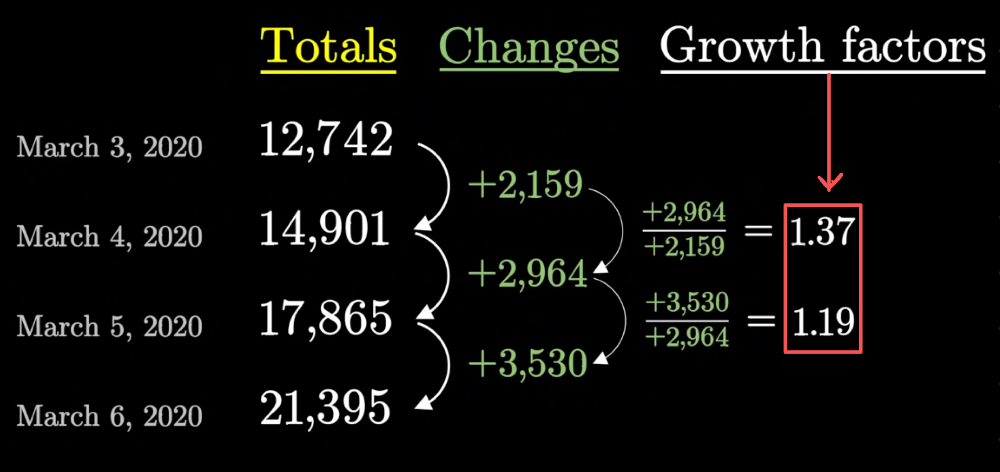

### Let's calculate it.

In [46]:
df['growth_factor'] = df['newCassesAcc'] / df['newCassesAcc'].shift(1)
df

,newCassesAcc,currentTotalCasesAcc,suceptibaleCasesAcc,totalDeathsAcc,activeCases,growth_factor
simulationDay,,,,,,
1,1,2,19999998,0,1,NaN
2,1,3,19999997,0,2,1.000000
3,2,5,19999995,0,3,2.000000
4,3,8,19999992,0,4,1.500000
5,4,12,19999988,1,6,1.333333
...,...,...,...,...,...,...
88,1,16245047,3754953,2118919,4,1.000000
89,1,16245048,3754952,2118919,3,1.000000
90,0,16245048,3754952,2118919,2,0.000000


### Let's plot the growth factor:

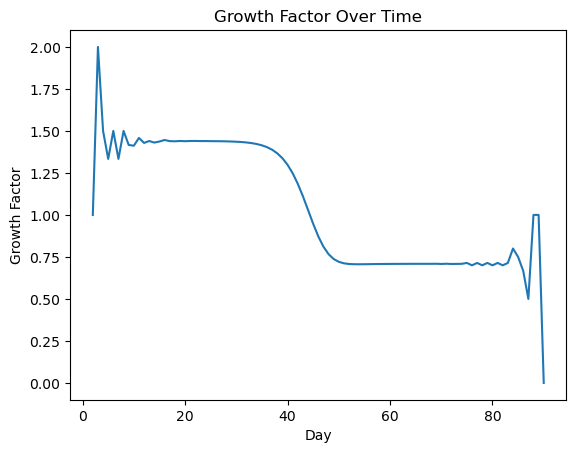

In [47]:
import matplotlib.pyplot as plt

plt.plot(df['growth_factor'])
plt.xlabel('Day')
plt.ylabel('Growth Factor')
plt.title('Growth Factor Over Time')
plt.show()

### As we can see, during the first week was the peak, and until almost day 45 the growth rate was larger than 1. Therefore, there was exponential growth and spreading of the virus. After roughly day 45, it dropped below one hinting that the pandemic was starting to shrink until eventually it reached zero after almost 90 days signaling the end of the pandemic.

### Let's save the dataframe locally as csv so it be opened using excel.

In [48]:
df.to_csv('Pandemic_simulation.csv', index=False)